In [10]:
] activate .

  Activating project at `~/devansh/HJB.jl/examples`


In [16]:
] st

Status `~/devansh/HJB.jl/examples/Project.toml`
  [0c46a032] DifferentialEquations v7.12.0
  [a3cb4e6c] HJB v1.0.0-DEV `..`
  [a98d9a8b] Interpolations v0.15.1
  [b4f0291d] LazySets v2.11.4
  [91a5bcdd] Plots v1.40.1
  [49802e3a] ProgressBars v1.5.1
  [295af30f] Revise v3.5.13
  [90137ffa] StaticArrays v1.9.2
  [5d786b92] TerminalLoggers v0.1.7


In [17]:
] precompile 

## Import Dependencies

In [18]:
# the first thing to do is to set up the loggers
# for the differential equation solver
using Logging: global_logger
using TerminalLoggers: TerminalLogger
global_logger(TerminalLogger() )

# now import all the libraries
using Plots, DifferentialEquations, LinearAlgebra, StaticArrays

using HJB

using BenchmarkTools

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]
┌ Info: Precompiling DifferentialEquations
└ [0c46a032-eb83-5123-abaf-570d42b7fbaa]
Precompiling HJB
  ✓ GLPK
  ✓ JuMP
  ✓ LazySets
  ✓ HJB
  4 dependencies successfully precompiled in 54 seconds. 121 already precompiled.
[ Info: Precompiling HJB [a3cb4e6c-25e7-429f-8c59-1a4059c3ba7b]
┌ Warning: Module MathOptInterface with build ID fafbfcfd-8473-237a-0000-83e0d54f0071 is missing from the cache.
│ This may mean MathOptInterface [b8f27783-ece8-5eb3-8dc8-9495eed66fee] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1942
┌ Info: Skipping precompilation since precompile(false). Importing HJB
└ [a3cb4e6c-25e7-429f-8c59-1a4059c3ba7b].
[ Info: Precompiling LazySets [b4f0291d-fe17-52bc-9479-3d1a343d9043]
┌ Warning: Module MathOptInterface with build ID fafbfcfd-8473-237a-0000-83e0d54f0071 is missing from the cache.
│ 

In [19]:
Threads.nthreads()

16

## Problem: Inverted Pendulum with Boundary on Angles
This one has a stationary pivot point, so its only 2D problem

The dynamics are
$$
    \dot \theta = \omega\\
    \dot \omega = \frac{g}{l} \sin(\theta) + u
$$

Then $\theta=0$ is the (unstable) upright angle that we want to keep the system near, and $u$ is the torque that we can apply. Lets say the torque is bounded to $[-6,6]$, and $g = 9.81$, $l=1.0$

Say the constraint is to keep $\theta \in [-\pi/3, \pi/2]$. 

### Define the Dynamics, and the Hamiltonian

In [235]:
# define the dynamics

function f(x)
    g = 9.81
    l = 1.0
    
    θ = x[1]
    ω = x[2]
    
    return @SVector [ω, g/l * sin(θ)]
end
function g(x)
    return @SMatrix [ [0;;]; [1;;]]
end
function F(t, x, u)
   f(x) + g(x) * u 
end

# define the Hamiltonian
function H(t, x, V, DxV)
    umax = 6.0
    u1 = @SVector [umax]
    u2 = @SVector [-umax]
    H1 = DxV' * F(t, x, u1)
    H2 = DxV' * F(t, x, u2)
    γ = 0.25

    # CBF Hamiltonian!
    return min(0, max(H1, H2) + γ*V)
    # return max(H1, H2) + γ*V
end

function smooth_min(a,  b, k=0.5)
     res = exp2( -a/k ) + exp2( -b/k );
    return -k*log2( res );
end

# define the constraint function
θmin = -π/3
θmax = π/2
function l(x)
   
    ## quadratic cosntraint
    # return (π/3)^2 - x[1]^2    
    
    ## linear (discontinuous constraint)
    # if (x[1] < 0)
    #   return x[1] - θmin
    # else
    #   return θmax -x[1]
    # end
    
    # smooth min constraint
    return smooth_min(x[1] - θmin, θmax - x[1])

end


l (generic function with 1 method)

### Define the Numerical Hamiltonian

In [286]:

# you need to define some dissipation coefficients
# this is a vector of maximum absolute derivatives of H along each spatial dimension
# function dissipation_coefficients(t, x)
#     return @SVector [1.0, 1.0]
# end

function dissipation_coefficients(t, x)
    return @SVector [abs(x[2]), 9.81 + 6.0] 
end

numericalHamiltonianMethod = HJB.LocalLaxFriedrichsNHM(
    HJB.LeftWenoGradient(),
    HJB.RightWenoGradient(), 
    dissipation_coefficients
    )

HJB.LocalLaxFriedrichsNHM{HJB.LeftWenoGradient{Float64}, HJB.RightWenoGradient{Float64}, typeof(dissipation_coefficients)}(HJB.LeftWenoGradient{Float64}(1.0e-6), HJB.RightWenoGradient{Float64}(1.0e-6), dissipation_coefficients)

### Create a Grid

In [287]:
x1s = -π:0.05:π
x2s = -7:0.025:5
grid = HJB.Grid((x1s, x2s))

HJB.Grid{2, Float64}((-3.141592653589793, -7.0), (0.05, 0.025), (126, 481), 3)

### Construct the ODE Problem

In [288]:
prob = HJB.get_ODEProblem(H, l, grid, (0.0, -10.0), numericalHamiltonianMethod)

ODEProblem with uType OffsetArrays.OffsetMatrix{Float64, Matrix{Float64}} and tType Float64. In-place: true
timespan: (0.0, -10.0)
u0: 132×487 OffsetArray(::Matrix{Float64}, -3:128, -3:483) with eltype Float64 with indices -3:128×-3:483:
 0.0  0.0  0.0   0.0       0.0      …   0.0       0.0      0.0  0.0  0.0
 0.0  0.0  0.0   0.0       0.0          0.0       0.0      0.0  0.0  0.0
 0.0  0.0  0.0   0.0       0.0          0.0       0.0      0.0  0.0  0.0
 0.0  0.0  0.0  -2.09445  -2.09445     -2.09445  -2.09445  0.0  0.0  0.0
 0.0  0.0  0.0  -2.04446  -2.04446     -2.04446  -2.04446  0.0  0.0  0.0
 0.0  0.0  0.0  -1.99447  -1.99447  …  -1.99447  -1.99447  0.0  0.0  0.0
 0.0  0.0  0.0  -1.94448  -1.94448     -1.94448  -1.94448  0.0  0.0  0.0
 0.0  0.0  0.0  -1.8945   -1.8945      -1.8945   -1.8945   0.0  0.0  0.0
 0.0  0.0  0.0  -1.84451  -1.84451     -1.84451  -1.84451  0.0  0.0  0.0
 0.0  0.0  0.0  -1.79453  -1.79453     -1.79453  -1.79453  0.0  0.0  0.0
 0.0  0.0  0.0  -1.74455  -1.744

### Plot the Value function at the terminal time
This is just a sanity check

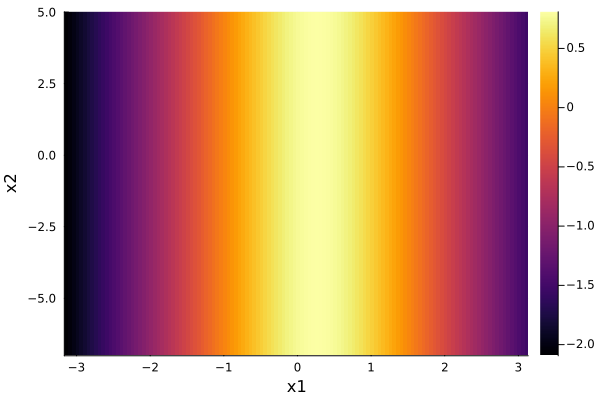

In [289]:
hjb_plot(grid, prob.u0)

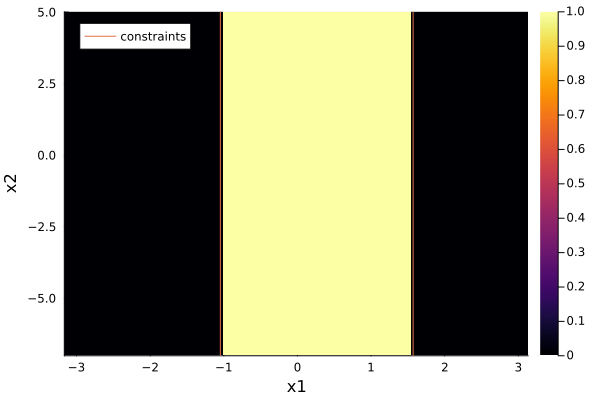

In [290]:
hjb_plot(grid, prob.u0 .>= 0.0)
vline!([θmin, θmax], label="constraints")

### Solve the ODE Problem

In [291]:
# Choose any solver from `DifferentialEquations.jl`. Here are some choices:
#   SSPRK54() # good
#   SSPRK53() # good
#   SSPRK22() # good
#   SSPRK43() # very slow
#   Tsit5() # good
#   unspecified # good

@time sol = solve(prob; reltol=1e-6, abstol=1e-6, progress=true, dt=5e-3, alg=SSPRK53())

ODE   0%|                                               |  ETA: N/A
ODE  50%|███████████████████████▌                       |  ETA: 0:00:09


 18.695558 seconds (4.11 M allocations: 2.402 GiB, 4.21% gc time, 4.23% compilation time: 6% of which was recompilation)


ODE 100%|███████████████████████████████████████████████| Time: 0:00:18
ODE 100%|███████████████████████████████████████████████| Time: 0:00:18


retcode: Success
Interpolation: 3rd order Hermite
t: 2001-element Vector{Float64}:
   0.0
  -0.005
  -0.01
  -0.015
  -0.02
  -0.025
  -0.030000000000000002
  -0.035
  -0.04
  -0.045
  -0.049999999999999996
  -0.05499999999999999
  -0.05999999999999999
   ⋮
  -9.945000000000155
  -9.950000000000156
  -9.955000000000156
  -9.960000000000157
  -9.965000000000158
  -9.970000000000159
  -9.97500000000016
  -9.98000000000016
  -9.985000000000161
  -9.990000000000162
  -9.995000000000163
 -10.0
u: 2001-element Vector{OffsetArrays.OffsetMatrix{Float64, Matrix{Float64}}}:
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0

### Plot the Solutions

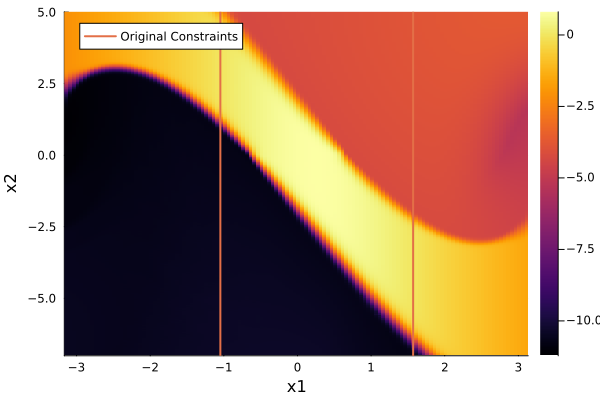

In [292]:
hjb_plot(grid, sol.u[end])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

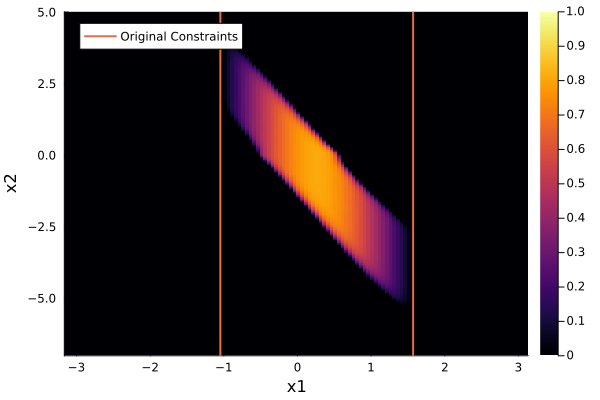

In [293]:
hjb_plot(grid, sol.u[end], clims=(0, 1.0))
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

[ Info: Saved animation to /home/dasc3/devansh/HJB.jl/examples/tmp.gif


Plots.AnimatedGif("/home/dasc3/devansh/HJB.jl/examples/tmp.gif")
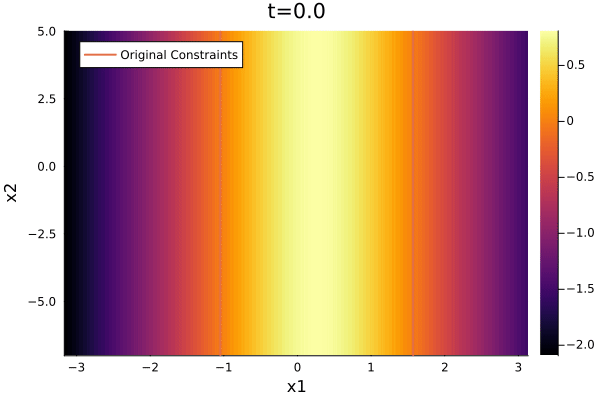

In [294]:
tmin = minimum(sol.t)
tmax = maximum(sol.t)

# i shall animate backwards in time, which should make it easier to see if the solution has converged
@gif for t=range(tmax, tmin, length=30)
    # interpolate the data
    data = sol(t)
    hjb_plot(grid, data)
    vline!([θmin, θmax], linewidth=2, label="Original Constraints")
    title!("t=$(t)")
end

Draw a Level Set

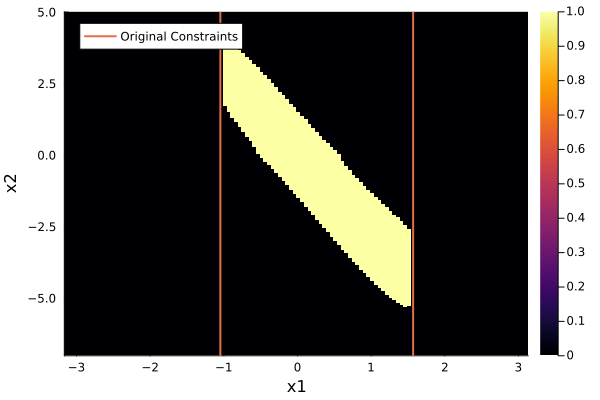

In [295]:
plot()
hjb_plot!(grid, sol.u[end] .>= 0.0)
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

[ Info: Saved animation to /home/dasc3/devansh/HJB.jl/examples/tmp.gif


Plots.AnimatedGif("/home/dasc3/devansh/HJB.jl/examples/tmp.gif")
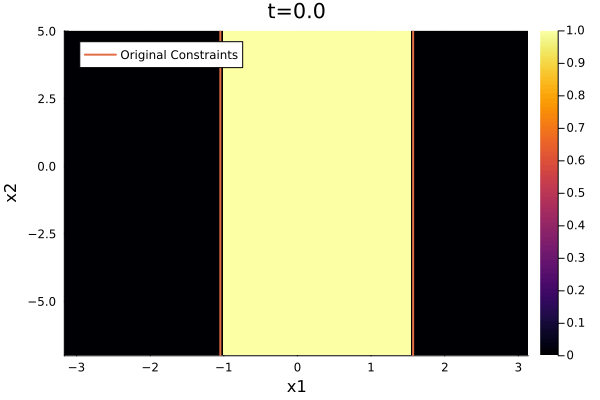

In [296]:
tmin = minimum(sol.t)
tmax = maximum(sol.t)

# i shall animate backwards in time, which should make it easier to see if the solution has converged
@gif for t=range(tmax, tmin, length=30)
    # interpolate the data
    data = sol(t)
    hjb_plot(grid, data .>= 0.0)
    vline!([θmin, θmax], linewidth=2, label="Original Constraints")
    title!("t=$(t)")
end

looks like it has more or less converged

## Run a CBF-QP controller on this Value function

### Create an Interpolation
The method is to first create an interpolator for the solution to the HJB, and then we can run a controller. The `Interpolations.jl` package provides some really convenient interfaces.b

In [297]:
using Interpolations

xs = HJB.getDomainAxes(grid, 1)
ys = HJB.getDomainAxes(grid, 2)

data = sol.u[end][HJB.DomainIndices(grid)];

itp = scale(interpolate(data, BSpline(Cubic(Line(OnGrid())))), (xs, ys))

126×481 scale(interpolate(OffsetArray(::Matrix{Float64}, 0:127, 0:482), BSpline(Cubic(Line(OnGrid())))), (-3.141592653589793:0.05:3.108407346410207, -7.0:0.025:5.0)) with element type Float64:
 -10.5811    -10.5739    -10.5703    …  -2.09445  -2.09445  -2.09445
 -10.5858    -10.5794    -10.5758       -2.04446  -2.04446  -2.04446
 -10.5907    -10.586     -10.5816       -1.99447  -1.99447  -1.99447
 -10.5963    -10.5912    -10.588        -1.94448  -1.94448  -1.94448
 -10.6021    -10.5976    -10.5937       -1.8945   -1.8945   -1.8945
 -10.6089    -10.604     -10.6003    …  -1.84451  -1.84451  -1.84451
 -10.6166    -10.6115    -10.6071       -1.79453  -1.79453  -1.79453
 -10.6254    -10.6198    -10.6152       -1.74455  -1.74455  -1.74455
 -10.6354    -10.6294    -10.6238       -1.69457  -1.69457  -1.69457
 -10.6468    -10.64      -10.634        -1.6446   -1.6446   -1.6446
 -10.6588    -10.6518    -10.6451    …  -1.59463  -1.59463  -1.59463
 -10.6704    -10.6633    -10.6568       -1.54466  

### Plot the Interpolation
check the interpolation looks reasonable by plotting it

In [298]:
itp(0,-3)

-10.689327685994357

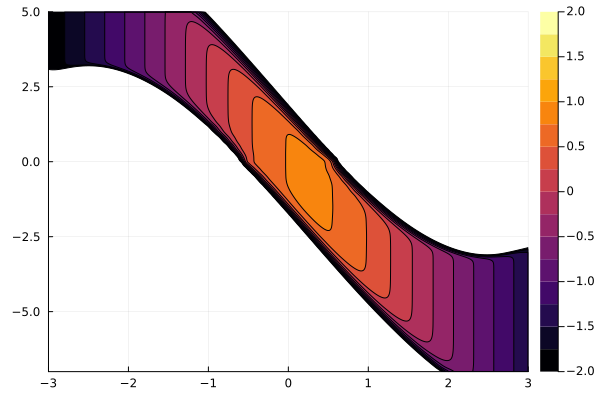

In [321]:
plot()
contourf(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), clims=(-2,2))

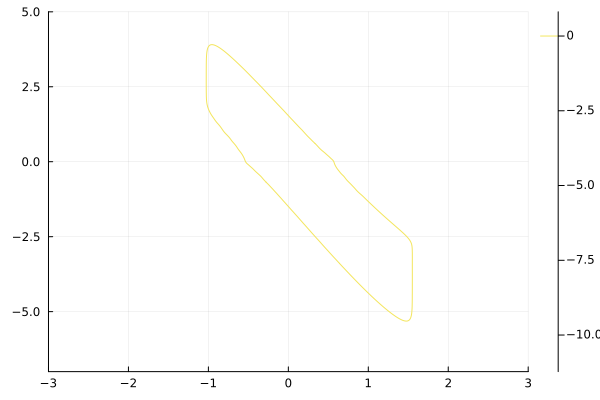

In [300]:
plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])

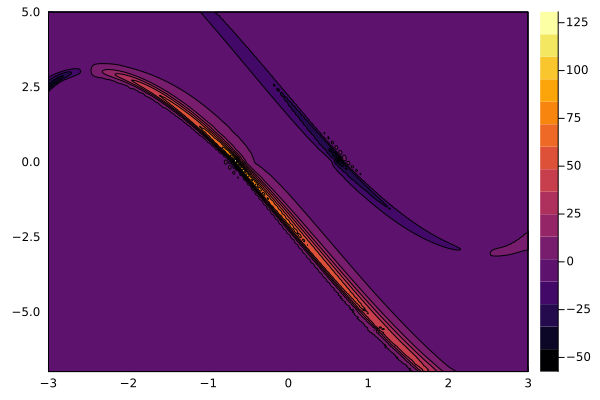

In [301]:
plot()
contourf(-3:0.01:3, -7:0.01:5, (x,y)->Interpolations.gradient(itp, x,y)[1])

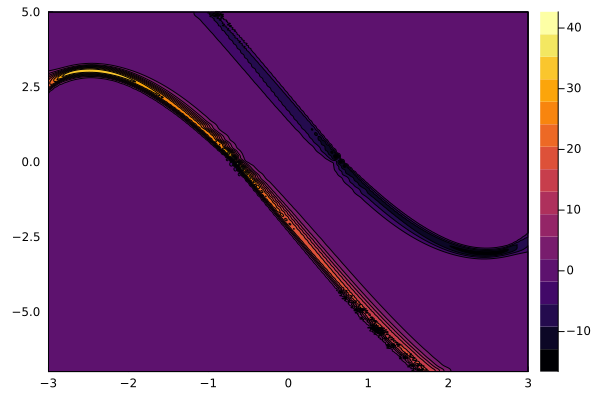

In [302]:
plot()
contourf(-3:0.01:3, -7:0.01:5, (x,y)->Interpolations.gradient(itp, x,y)[2])

### Define the CBF

In [303]:
h(x) = itp(x...)

h (generic function with 1 method)

In [304]:
∇h(x) = Interpolations.gradient(itp, x...)

∇h (generic function with 1 method)

In [305]:
Lfh(x) = ∇h(x)' * f(x)
Lgh(x) = ∇h(x)' * g(x)

Lgh (generic function with 1 method)

In [306]:
Lfh([0,1.0])

-0.15933974754478442

In [307]:
Lgh([0,1.0])

1×1 adjoint(::SVector{1, Float64}) with eltype Float64 with indices SOneTo(1)×SOneTo(1):
 -0.18005232961597437

### Create the QP Controller
Here we simply use the closed-form qp controller

In [308]:
function qp_controller(x, uref=[0.0])
    h_ = h(x)
    Lfh_ = Lfh(x)
    Lgh_ = Lgh(x)
    γ = 0.25 # same as what is used in the original HJB solver
   
    # just use the closed-form solution of the CBF-QP controller
    if (Lfh_ + Lgh_ * uref >= -γ * h_)
        return uref
    else
        return uref - (Lfh_ + Lgh_ * uref + γ * h_) * Lgh_' / (Lgh_ * Lgh_')
    end
end

qp_controller (generic function with 2 methods)

In [309]:
qp_controller([0,1.], [100.0])

1-element SVector{1, Float64} with indices SOneTo(1):
 0.13925525444351194

### Construct the closed-loop dynamics
Here we have chosen the reference control input to a constant -6.0

In [310]:
function closed_loop_dynamics(state, params, time)
    
#     if h(state) <= 1e-3
#         return 0*state
#     end
    
    uref = @SVector [-6.0]
    
    u = qp_controller(state, uref)
    
    xdot = F(time, state, u)
    
end
    

closed_loop_dynamics (generic function with 1 method)

### Simulate a few case

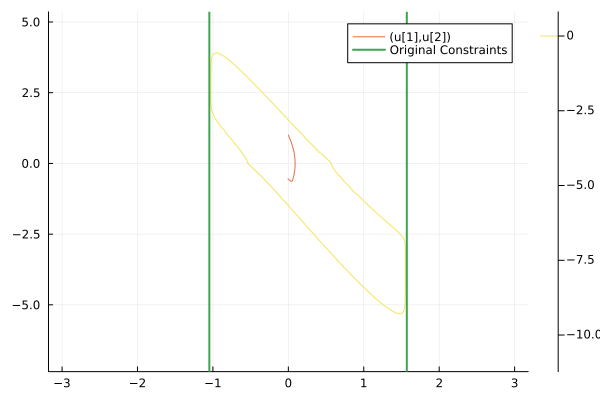

In [319]:
x0 = @SVector [0., 1]

dynProb = ODEProblem(closed_loop_dynamics, x0, (0.0, 0.40))
dynSol = solve(dynProb, Tsit5());

plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])
plot!(dynSol, idxs=[(1,2)])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

In [322]:
dynSol

retcode: Success
Interpolation: specialized 4th order "free" interpolation
t: 12-element Vector{Float64}:
 0.0
 0.0009989830533767418
 0.01098881358714416
 0.047153019289564
 0.1103986458102002
 0.19178724058757168
 0.28866801612347026
 0.31484950626541525
 0.3352714105395213
 0.36312869870948633
 0.39491523156124353
 0.4
u: 12-element Vector{SVector{2, Float64}}:
 [0.0, 1.0]
 [0.0009959907795290648, 0.9940109869320487]
 [0.010628685421141175, 0.9346464518468321]
 [0.040642251456592095, 0.7269765039183056]
 [0.07568175471030646, 0.38468315024845096]
 [0.08981977793159224, -0.035390052456700696]
 [0.062126092598277914, -0.5406824599732615]
 [0.046399323106979855, -0.630815940559261]
 [0.0335276048139279, -0.6251378964520548]
 [0.01652402280913119, -0.5936259124348036]
 [-0.0017014884851006152, -0.5535398650166722]
 [-0.004500542640608041, -0.5474330469336943]

In [323]:
closed_loop_dynamics([-0.004500542640608041, -0.5474330469336943], nothing, 0.0)

2-element SVector{2, Float64} with indices SOneTo(2):
 -0.5474330469336943
  1.1911865627052567

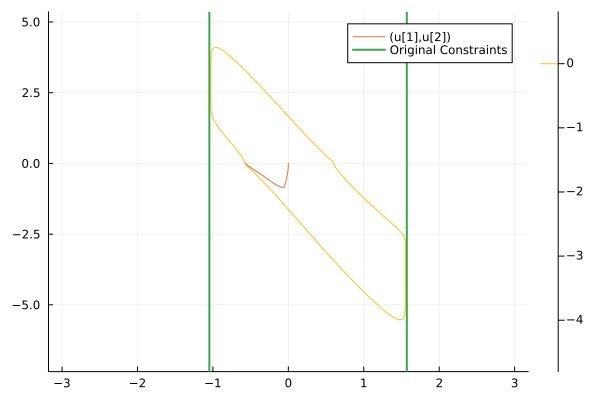

In [260]:
x0 = @SVector [0., 0]

dynProb = ODEProblem(closed_loop_dynamics, x0, (0.0, 3.0))
dynSol = solve(dynProb, Tsit5());

plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])
plot!(dynSol, idxs=[(1,2)])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

In [259]:
x0 = @SVector [-0.5, 1.8]

dynProb = ODEProblem(closed_loop_dynamics, x0, (0.0, 0.25))
dynSol = solve(dynProb, Tsit5(), dt=1e-5);

plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])
plot!(dynSol, idxs=[(1,2)])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")

LoadError: BoundsError: attempt to access 126×481 scale(interpolate(OffsetArray(::Matrix{Float64}, 0:127, 0:482), BSpline(Cubic(Line(OnGrid())))), (-3.141592653589793:0.05:3.108407346410207, -7.0:0.025:5.0)) with element type Float64 at index [-0.3622256082129707, -66.11658991938589]

In [261]:
x0s = [
#     (@SVector [0, 2.]),
    (@SVector [0, 1.]),
    (@SVector [0, 0.]),
    (@SVector [0, -1.]),
    (@SVector [0, -2.]),
    (@SVector [-0.25, 0.5]),
    (@SVector [0.5, -1]),
    (@SVector [-0.5, 2]),
    (@SVector [0.5, -2]),
#     (@SVector [-0.5, 2.1])
]

plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")
for x0 in x0s
    dynProb = ODEProblem(closed_loop_dynamics, x0, (0.0, 3.0))
    dynSol = solve(dynProb, Tsit5(), dt=1e-3);
    plot!(dynSol, idxs=[(1,2)], label="x0=$(x0)")
end
plot!()

LoadError: BoundsError: attempt to access 126×481 scale(interpolate(OffsetArray(::Matrix{Float64}, 0:127, 0:482), BSpline(Cubic(Line(OnGrid())))), (-3.141592653589793:0.05:3.108407346410207, -7.0:0.025:5.0)) with element type Float64 at index [0.2132023805307204, 147.25230130676383]

In [150]:
## Plot a Quiver plot to see the flow

In [152]:
?quiver

search: quiver quiver!



```
quiver(x,y,quiver=(u,v))
quiver!(x,y,quiver=(u,v))
```

Make a quiver (vector field) plot. The `i`th vector extends from `(x[i],y[i])` to `(x[i] + u[i], y[i] + v[i])`.

# Keyword arguments

  * `arrow::Union{Bool, Plots.Arrow}`: Defines arrowheads that           should be displayed at the end of path line segments           (just before a NaN and the last non-NaN point). Used in           quiverplot, streamplot, or similar. Aliases: (:arrows,).

# Example

```julia-repl
julia> quiver([1,2,3],[3,2,1],quiver=([1,1,1],[1,2,3]))
```


In [153]:
rand(2)

2-element Vector{Float64}:
 0.047339674886847205
 0.45418267342194785

In [194]:
x0s = SVector{2, Float64}[]
xdots = SVector{2, Float64}[]
while length(x0s) < 1000
    x01 = 2*π * rand() - π
    x02 = 14 * rand() - 7
    x0 = @SVector [x01, x02]
    if !( -7 < x02 < 5)
        continue
    end
    if !(-3 < x01 < 3)
        continue
    end
#     if h(x0) < 0
#         continue
#     end
    
    # compute the xdot
    xdot = closed_loop_dynamics(x0, nothing, 0.0)
    
    # normalize it and reduce size
    xdot = xdot * 0.05
    if norm(xdot) > 0.1
        xdot = 0.1 * xdot / norm(xdot)
    end
    xdot = 0.4 * xdot / norm(xdot)
    
    push!(x0s, x0)
    push!(xdots, xdot)
end

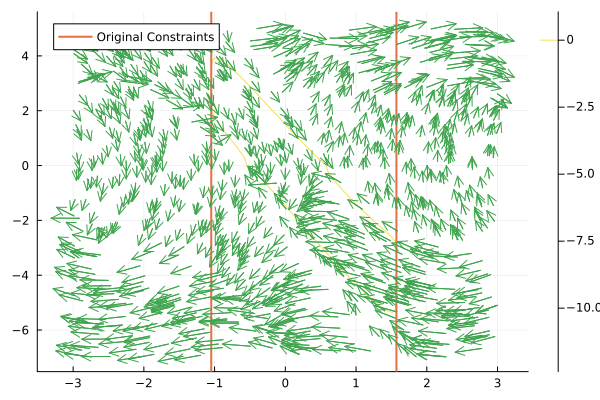

In [195]:
plot()
contour(-3:0.01:3, -7:0.01:5, (x,y)->itp(x,y), levels=[0.0])
vline!([θmin, θmax], linewidth=2, label="Original Constraints")
quiver!([x[1] for x in x0s], [x[2] for x in x0s], quiver=([xd[1] for xd in xdots], [xd[2] for xd in xdots]))

In [181]:
?quiver

search: quiver quiver!



```
quiver(x,y,quiver=(u,v))
quiver!(x,y,quiver=(u,v))
```

Make a quiver (vector field) plot. The `i`th vector extends from `(x[i],y[i])` to `(x[i] + u[i], y[i] + v[i])`.

# Keyword arguments

  * `arrow::Union{Bool, Plots.Arrow}`: Defines arrowheads that           should be displayed at the end of path line segments           (just before a NaN and the last non-NaN point). Used in           quiverplot, streamplot, or similar. Aliases: (:arrows,).

# Example

```julia-repl
julia> quiver([1,2,3],[3,2,1],quiver=([1,1,1],[1,2,3]))
```
